# [LG 에너지 솔루션]
## DX Expert 양성과정 WEEK 2
## Transformer - (2) 이미지 데이터 실습



## 강의 복습

강의자료 : Transformer, AGENDA 02 - Vision Transformer

## 실습 요약
1. 본 실습에서는 VisionTransfomer 기반의 이상치 탐지 모델인 AnoViT를 활용하여 이미지 이상탐지 모델을 구축합니다
2. 학습된 모델을 활용하여 평가를 진행합니다.
3. 해당 모델에 대한 전체적인 구조는 강의자료 AGENDA 02 106 page에서 확인하실 수 있습니다

---

### STEP 0. 환경 구축하기
* 필요한 library들을 import 합니다

In [ ]:
# github에서 데이터 불러오기
!git clone https://github.com/yukyunglee/LG_ES_Transformer

In [ ]:
! unzip ./LG_ES_Transformer/data/dataset.zip -d ./LG_ES_Transformer/data

In [3]:
import os
import time
import random
import copy
from PIL import Image
from tqdm import tqdm
import numpy as np
import torch
import torch.nn as nn
import torch.cuda.amp as amp
import torch.backends.cudnn as cudnn
from easydict import EasyDict
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

from LG_ES_Transformer.AnoViT.model import Decoder_r
from LG_ES_Transformer.AnoViT.funcs import EarlyStop
from LG_ES_Transformer.AnoViT.dataloader import get_dataloader
from LG_ES_Transformer.AnoViT.utils import time_string, convert_secs2time, AverageMeter, print_log
from LG_ES_Transformer.AnoViT.timm.models.vision_transformer import *
from LG_ES_Transformer.AnoViT.timm import create_model
from LG_ES_Transformer.AnoViT.funcs import plt_show, denormalization
from LG_ES_Transformer.AnoViT.mean_std import obj_stats_384

#check torch version & device
print ("Python version:[%s]."%(sys.version))
print ("PyTorch version:[%s]."%(torch.__version__))
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print ("device:[%s]."%(device)) # device에 cuda:0가 프린트 된다면 GPU를 사용하는 상태입니다

Python version:[3.7.0 (default, Oct  9 2018, 10:31:47) 
[GCC 7.3.0]].
PyTorch version:[1.6.0].
device:[cuda:0].


In [ ]:
# set random seed 

def set_seed(random_seed):
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed)  # if use multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(random_seed)
    random.seed(random_seed)
    
random_seed = 42
set_seed(random_seed)

### STEP 1. 데이터 준비하기

금일 실습에서는 **MVTecAD**데이터를 사용합니다. 
* 실제 산업 현장에서 발생가능한 결함들을 직접 생성하여 구축된 이미지 데이터
* 데이터셋 출처
  https://www.mvtec.com/company/research/datasets/mvtec-ad


* 해당 실습에서는 전체 15가지 카테고리 데이터 중 'grid'에 대한 카테고리에 대해 실험을 진행함


In [ ]:
# 현재 데이터는 확인 용도

# normal 이미지 불러오기
img_path = './LG_ES_Transformer/02_VisionTransformer/dataset/grid/test/good/000.png'
normal_img = Image.open(img_path)
normal_img

In [ ]:
# abnormal 이미지 불러오기
img_path = './LG_ES_Transformer/02_VisionTransformer/dataset/grid/test/broken/000.png'
normal_img = Image.open(img_path)
normal_img

### STEP 2. 학습 및 평가에 필요한 하이퍼파라미터 설정

In [2]:
args = EasyDict({
    'n_gpu':1,
    'image_size':384,
    'patch_size':16,
    'device':'cuda',
    'batch_size':8,
    'num_workers':16,
    'epochs':200,
    'lr':2e-4,
    'wd':1e-5,
    'obj':'grid',
    'val_ratio':0.4,
    'save_dir':'./result',
    'dataset_path':'dataset',
    'model':'vit',
    'amp':True,
    'seed':42,
    'beta1':0.5,
    'beta2':0.999
})

In [4]:
device = args.device
if not os.path.exists(args.save_dir):
    os.makedirs(args.save_dir)

log = open('model_training_log_{}_{}.txt'.format(args.obj, args.model), 'w')
scaler = amp.GradScaler()

model = create_model('vit_base_patch16_384', pretrained=True)
decmodel = nn.Sequential(model, Decoder_r(args))
decmodel.to(device)

Sequential(
  (0): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): Sequential(
      (0): Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU()
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
        )
      )
      (1): Block(
        (norm

### STEP 3. Pytorch Dataset 정의하기

In [ ]:
# 참고용 코드입니다. 해당 셀에서 실행하지 않습니다 

# def get_dataloader(args):
#     obj_mean, obj_std = obj_stats_384(args.obj)
#     trainT = T.Compose([T.Resize(args.image_size, Image.ANTIALIAS),
#                         T.ToTensor(),
#                         T.Normalize(mean=obj_mean,
#                                     std=obj_std)
#                                     ])

#     validT = T.Compose([T.Resize(args.image_size, Image.ANTIALIAS),
#                         T.ToTensor(),   
#                         T.Normalize(mean=obj_mean,
#                                     std=obj_std)
#                                     ])

#     testT = T.Compose([T.Resize(args.image_size, Image.ANTIALIAS),
#                         T.ToTensor(),
#                         T.Normalize(mean=obj_mean,
#                                     std=obj_std)
#                                     ])


#     train_dataset = MVTecDataset(args, args.dataset_path, class_name=args.obj, is_train=True, resize=args.image_size, transform_x=trainT)
#     valid_dataset = MVTecDataset(args, args.dataset_path, class_name=args.obj, is_train=True, resize=args.image_size, transform_x=validT)
#     img_nums = len(train_dataset)

#     indices = list(range(img_nums))
#     np.random.seed(args.seed)
#     np.random.shuffle(indices)
#     split = int(np.floor(args.val_ratio * img_nums))
#     train_idx, valid_idx = indices[split:], indices[:split]
#     train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
#     valid_sampler = torch.utils.data.SubsetRandomSampler(valid_idx)

#     test_dataset = MVTecDataset(args, args.dataset_path, class_name=args.obj, is_train=False, resize=args.image_size, transform_x=testT)


#     train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=args.batch_size, sampler=train_sampler)
#     val_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=args.batch_size, sampler=valid_sampler)
#     test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False)


#     return train_loader, val_loader, test_loader

In [5]:
train_loader, val_loader, _ = get_dataloader(args)

### STEP 4. 모델 학습 진행하기

In [6]:
optimizer = torch.optim.Adam(
        params=decmodel.parameters(),
        lr=args.lr,
        betas=(args.beta1, args.beta2))

In [7]:
def train(args, scaler, model, epoch, train_loader, optimizer, log):
    model.train()
    MSE = nn.MSELoss()

    for (x, _, _) in tqdm(train_loader):
        x = x.to(args.device)
        optimizer.zero_grad()
        if args.amp:
            with amp.autocast():
                x_hat = model(x)
                loss = MSE(x, x_hat)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

    print_log('Train Epoch: {} | MSE Loss: {:.6f}'.format(epoch, loss), log)


def val(args, model, epoch, val_loader, log):
    model.eval()
    MSE = nn.MSELoss()

    for (x, _, _) in tqdm(val_loader):
        x = x.to(args.device)
        with torch.no_grad():
            x_hat = model(x)
            loss = MSE(x, x_hat)
            
            if epoch % 10 == 0:
                plt_show(args, x_hat, x, epoch)


    print_log(('Valid Epoch: {} | MSE Loss: {:.6f}'.format(epoch, loss)), log)

    return loss

   1/200 ----- [[2022-07-06 10:30:38]] [Need: 00:00:00]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 1 | MSE Loss: 1.312991


100%|██████████| 14/14 [00:02<00:00,  4.96it/s]


Valid Epoch: 1 | MSE Loss: 0.910271
Validation loss decreased (inf --> 0.910271).  Saving model ...
   2/200 ----- [[2022-07-06 10:30:50]] [Need: 00:39:49]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 2 | MSE Loss: 0.930546


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]


Valid Epoch: 2 | MSE Loss: 1.378486
EarlyStopping counter: 1 out of 12
   3/200 ----- [[2022-07-06 10:31:01]] [Need: 00:37:25]


100%|██████████| 20/20 [00:07<00:00,  2.53it/s]


Train Epoch: 3 | MSE Loss: 1.225198


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]


Valid Epoch: 3 | MSE Loss: 0.707681
Validation loss decreased (0.910271 --> 0.707681).  Saving model ...
   4/200 ----- [[2022-07-06 10:31:13]] [Need: 00:37:48]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 4 | MSE Loss: 0.890728


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]


Valid Epoch: 4 | MSE Loss: 1.065965
EarlyStopping counter: 1 out of 12
   5/200 ----- [[2022-07-06 10:31:23]] [Need: 00:36:55]


100%|██████████| 20/20 [00:07<00:00,  2.50it/s]


Train Epoch: 5 | MSE Loss: 0.907840


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]


Valid Epoch: 5 | MSE Loss: 1.066485
EarlyStopping counter: 2 out of 12
   6/200 ----- [[2022-07-06 10:31:34]] [Need: 00:36:20]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 6 | MSE Loss: 0.976842


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]


Valid Epoch: 6 | MSE Loss: 1.326501
EarlyStopping counter: 3 out of 12
   7/200 ----- [[2022-07-06 10:31:45]] [Need: 00:35:52]


100%|██████████| 20/20 [00:07<00:00,  2.53it/s]


Train Epoch: 7 | MSE Loss: 0.721649


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]


Valid Epoch: 7 | MSE Loss: 0.639754
Validation loss decreased (0.707681 --> 0.639754).  Saving model ...
   8/200 ----- [[2022-07-06 10:31:57]] [Need: 00:36:01]


100%|██████████| 20/20 [00:07<00:00,  2.52it/s]


Train Epoch: 8 | MSE Loss: 0.798910


100%|██████████| 14/14 [00:02<00:00,  5.07it/s]


Valid Epoch: 8 | MSE Loss: 0.925744
EarlyStopping counter: 1 out of 12
   9/200 ----- [[2022-07-06 10:32:07]] [Need: 00:35:38]


100%|██████████| 20/20 [00:07<00:00,  2.53it/s]


Train Epoch: 9 | MSE Loss: 0.682362


100%|██████████| 14/14 [00:02<00:00,  4.93it/s]


Valid Epoch: 9 | MSE Loss: 1.209348
EarlyStopping counter: 2 out of 12
  10/200 ----- [[2022-07-06 10:32:18]] [Need: 00:35:18]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 10 | MSE Loss: 0.574078


100%|██████████| 14/14 [00:06<00:00,  2.25it/s]


Valid Epoch: 10 | MSE Loss: 0.519052
Validation loss decreased (0.639754 --> 0.519052).  Saving model ...
  11/200 ----- [[2022-07-06 10:32:34]] [Need: 00:36:27]


100%|██████████| 20/20 [00:07<00:00,  2.52it/s]


Train Epoch: 11 | MSE Loss: 0.758593


100%|██████████| 14/14 [00:02<00:00,  5.08it/s]


Valid Epoch: 11 | MSE Loss: 0.501141
Validation loss decreased (0.519052 --> 0.501141).  Saving model ...
  12/200 ----- [[2022-07-06 10:32:46]] [Need: 00:36:22]


100%|██████████| 20/20 [00:08<00:00,  2.49it/s]


Train Epoch: 12 | MSE Loss: 0.687303


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]


Valid Epoch: 12 | MSE Loss: 0.600458
EarlyStopping counter: 1 out of 12
  13/200 ----- [[2022-07-06 10:32:56]] [Need: 00:35:58]


100%|██████████| 20/20 [00:07<00:00,  2.52it/s]


Train Epoch: 13 | MSE Loss: 0.700280


100%|██████████| 14/14 [00:02<00:00,  5.04it/s]


Valid Epoch: 13 | MSE Loss: 0.702242
EarlyStopping counter: 2 out of 12
  14/200 ----- [[2022-07-06 10:33:07]] [Need: 00:35:36]


100%|██████████| 20/20 [00:07<00:00,  2.50it/s]


Train Epoch: 14 | MSE Loss: 0.678497


100%|██████████| 14/14 [00:02<00:00,  4.95it/s]


Valid Epoch: 14 | MSE Loss: 0.598363
EarlyStopping counter: 3 out of 12
  15/200 ----- [[2022-07-06 10:33:18]] [Need: 00:35:16]


100%|██████████| 20/20 [00:07<00:00,  2.52it/s]


Train Epoch: 15 | MSE Loss: 0.658188


100%|██████████| 14/14 [00:02<00:00,  4.83it/s]


Valid Epoch: 15 | MSE Loss: 0.621537
EarlyStopping counter: 4 out of 12
  16/200 ----- [[2022-07-06 10:33:29]] [Need: 00:34:57]


100%|██████████| 20/20 [00:07<00:00,  2.50it/s]


Train Epoch: 16 | MSE Loss: 0.635241


100%|██████████| 14/14 [00:02<00:00,  5.09it/s]


Valid Epoch: 16 | MSE Loss: 1.051344
EarlyStopping counter: 5 out of 12
  17/200 ----- [[2022-07-06 10:33:40]] [Need: 00:34:39]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 17 | MSE Loss: 0.688775


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]


Valid Epoch: 17 | MSE Loss: 0.592982
EarlyStopping counter: 6 out of 12
  18/200 ----- [[2022-07-06 10:33:50]] [Need: 00:34:20]


100%|██████████| 20/20 [00:07<00:00,  2.50it/s]


Train Epoch: 18 | MSE Loss: 0.662110


100%|██████████| 14/14 [00:02<00:00,  5.03it/s]


Valid Epoch: 18 | MSE Loss: 0.546451
EarlyStopping counter: 7 out of 12
  19/200 ----- [[2022-07-06 10:34:01]] [Need: 00:34:04]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 19 | MSE Loss: 0.600981


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]


Valid Epoch: 19 | MSE Loss: 0.538156
EarlyStopping counter: 8 out of 12
  20/200 ----- [[2022-07-06 10:34:12]] [Need: 00:33:47]


100%|██████████| 20/20 [00:08<00:00,  2.50it/s]


Train Epoch: 20 | MSE Loss: 0.678659


 43%|████▎     | 6/14 [00:02<00:03,  2.18it/s]/home/yukyung/Project/LG_TFM/02_VisionTransformer/funcs.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, plots = plt.subplots(1, 2)
100%|██████████| 14/14 [00:06<00:00,  2.26it/s]


Valid Epoch: 20 | MSE Loss: 0.650606
EarlyStopping counter: 9 out of 12
  21/200 ----- [[2022-07-06 10:34:26]] [Need: 00:34:02]


100%|██████████| 20/20 [00:08<00:00,  2.49it/s]


Train Epoch: 21 | MSE Loss: 0.738507


100%|██████████| 14/14 [00:02<00:00,  5.04it/s]


Valid Epoch: 21 | MSE Loss: 0.561273
EarlyStopping counter: 10 out of 12
  22/200 ----- [[2022-07-06 10:34:37]] [Need: 00:33:46]


100%|██████████| 20/20 [00:08<00:00,  2.50it/s]


Train Epoch: 22 | MSE Loss: 0.625849


100%|██████████| 14/14 [00:02<00:00,  5.02it/s]


Valid Epoch: 22 | MSE Loss: 0.589763
EarlyStopping counter: 11 out of 12
  23/200 ----- [[2022-07-06 10:34:48]] [Need: 00:33:30]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 23 | MSE Loss: 0.529234


100%|██████████| 14/14 [00:02<00:00,  4.97it/s]


Valid Epoch: 23 | MSE Loss: 0.483150
Validation loss decreased (0.501141 --> 0.483150).  Saving model ...
  24/200 ----- [[2022-07-06 10:35:00]] [Need: 00:33:24]


100%|██████████| 20/20 [00:08<00:00,  2.50it/s]


Train Epoch: 24 | MSE Loss: 0.625608


100%|██████████| 14/14 [00:02<00:00,  5.14it/s]


Valid Epoch: 24 | MSE Loss: 0.613086
EarlyStopping counter: 1 out of 12
  25/200 ----- [[2022-07-06 10:35:10]] [Need: 00:33:08]


100%|██████████| 20/20 [00:08<00:00,  2.48it/s]


Train Epoch: 25 | MSE Loss: 0.602950


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]


Valid Epoch: 25 | MSE Loss: 0.610895
EarlyStopping counter: 2 out of 12
  26/200 ----- [[2022-07-06 10:35:21]] [Need: 00:32:52]


100%|██████████| 20/20 [00:08<00:00,  2.50it/s]


Train Epoch: 26 | MSE Loss: 0.659012


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]


Valid Epoch: 26 | MSE Loss: 0.498892
EarlyStopping counter: 3 out of 12
  27/200 ----- [[2022-07-06 10:35:32]] [Need: 00:32:37]


100%|██████████| 20/20 [00:07<00:00,  2.50it/s]


Train Epoch: 27 | MSE Loss: 0.544340


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]


Valid Epoch: 27 | MSE Loss: 0.490212
EarlyStopping counter: 4 out of 12
  28/200 ----- [[2022-07-06 10:35:43]] [Need: 00:32:22]


100%|██████████| 20/20 [00:08<00:00,  2.50it/s]


Train Epoch: 28 | MSE Loss: 0.643320


100%|██████████| 14/14 [00:02<00:00,  5.12it/s]


Valid Epoch: 28 | MSE Loss: 0.473395
Validation loss decreased (0.483150 --> 0.473395).  Saving model ...
  29/200 ----- [[2022-07-06 10:35:55]] [Need: 00:32:16]


100%|██████████| 20/20 [00:07<00:00,  2.50it/s]


Train Epoch: 29 | MSE Loss: 0.618311


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]


Valid Epoch: 29 | MSE Loss: 0.524926
EarlyStopping counter: 1 out of 12
  30/200 ----- [[2022-07-06 10:36:06]] [Need: 00:32:01]


100%|██████████| 20/20 [00:08<00:00,  2.49it/s]


Train Epoch: 30 | MSE Loss: 0.569240


100%|██████████| 14/14 [00:06<00:00,  2.25it/s]


Valid Epoch: 30 | MSE Loss: 0.587740
EarlyStopping counter: 2 out of 12
  31/200 ----- [[2022-07-06 10:36:20]] [Need: 00:32:06]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 31 | MSE Loss: 0.660950


100%|██████████| 14/14 [00:02<00:00,  5.15it/s]


Valid Epoch: 31 | MSE Loss: 0.587072
EarlyStopping counter: 3 out of 12
  32/200 ----- [[2022-07-06 10:36:31]] [Need: 00:31:51]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 32 | MSE Loss: 0.591606


100%|██████████| 14/14 [00:02<00:00,  5.11it/s]


Valid Epoch: 32 | MSE Loss: 0.501550
EarlyStopping counter: 4 out of 12
  33/200 ----- [[2022-07-06 10:36:41]] [Need: 00:31:36]


100%|██████████| 20/20 [00:08<00:00,  2.49it/s]


Train Epoch: 33 | MSE Loss: 0.679366


100%|██████████| 14/14 [00:02<00:00,  5.06it/s]


Valid Epoch: 33 | MSE Loss: 0.564157
EarlyStopping counter: 5 out of 12
  34/200 ----- [[2022-07-06 10:36:52]] [Need: 00:31:22]


100%|██████████| 20/20 [00:08<00:00,  2.49it/s]


Train Epoch: 34 | MSE Loss: 0.664769


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]


Valid Epoch: 34 | MSE Loss: 0.539439
EarlyStopping counter: 6 out of 12
  35/200 ----- [[2022-07-06 10:37:03]] [Need: 00:31:08]


100%|██████████| 20/20 [00:07<00:00,  2.50it/s]


Train Epoch: 35 | MSE Loss: 0.566903


100%|██████████| 14/14 [00:02<00:00,  5.05it/s]


Valid Epoch: 35 | MSE Loss: 0.903595
EarlyStopping counter: 7 out of 12
  36/200 ----- [[2022-07-06 10:37:14]] [Need: 00:30:55]


100%|██████████| 20/20 [00:08<00:00,  2.49it/s]


Train Epoch: 36 | MSE Loss: 0.591157


100%|██████████| 14/14 [00:02<00:00,  5.08it/s]


Valid Epoch: 36 | MSE Loss: 0.661863
EarlyStopping counter: 8 out of 12
  37/200 ----- [[2022-07-06 10:37:25]] [Need: 00:30:41]


100%|██████████| 20/20 [00:07<00:00,  2.50it/s]


Train Epoch: 37 | MSE Loss: 0.704622


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]


Valid Epoch: 37 | MSE Loss: 0.727737
EarlyStopping counter: 9 out of 12
  38/200 ----- [[2022-07-06 10:37:35]] [Need: 00:30:27]


100%|██████████| 20/20 [00:08<00:00,  2.50it/s]


Train Epoch: 38 | MSE Loss: 0.631962


100%|██████████| 14/14 [00:02<00:00,  5.10it/s]


Valid Epoch: 38 | MSE Loss: 0.559475
EarlyStopping counter: 10 out of 12
  39/200 ----- [[2022-07-06 10:37:46]] [Need: 00:30:14]


100%|██████████| 20/20 [00:07<00:00,  2.51it/s]


Train Epoch: 39 | MSE Loss: 0.643242


100%|██████████| 14/14 [00:02<00:00,  5.13it/s]


Valid Epoch: 39 | MSE Loss: 0.992563
EarlyStopping counter: 11 out of 12
  40/200 ----- [[2022-07-06 10:37:57]] [Need: 00:30:00]


100%|██████████| 20/20 [00:08<00:00,  2.49it/s]


Train Epoch: 40 | MSE Loss: 0.601813


100%|██████████| 14/14 [00:06<00:00,  2.22it/s]


Valid Epoch: 40 | MSE Loss: 0.500691
EarlyStopping counter: 12 out of 12


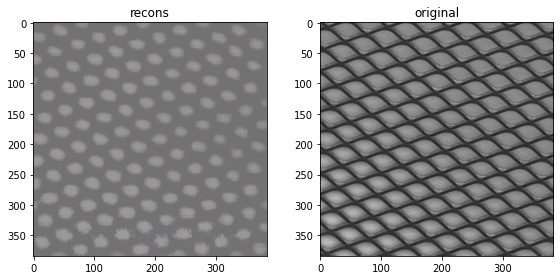

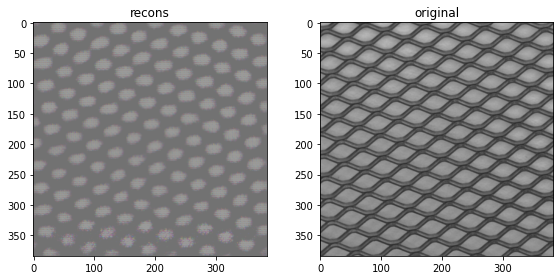

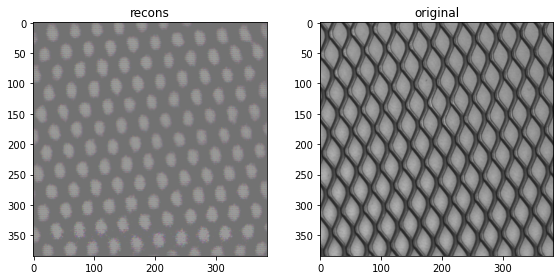

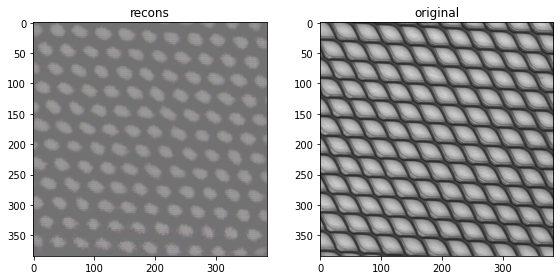

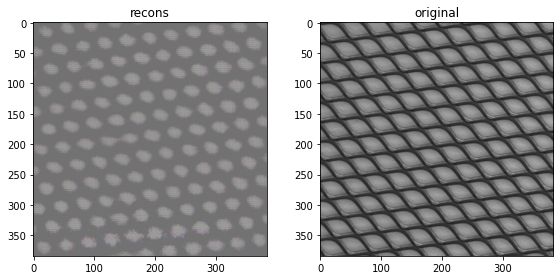

...

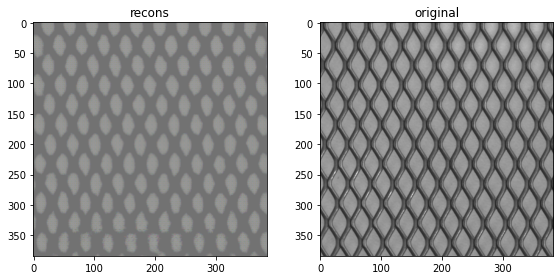

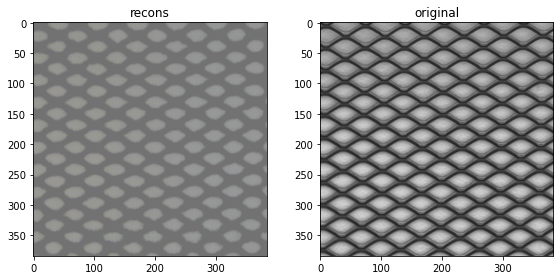

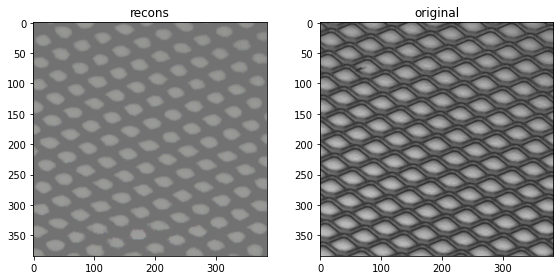

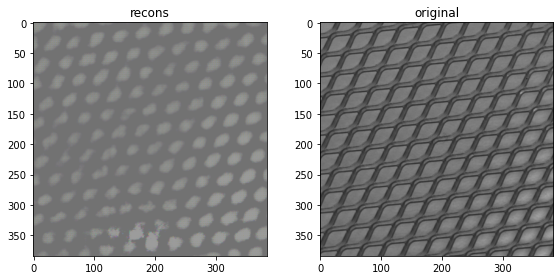

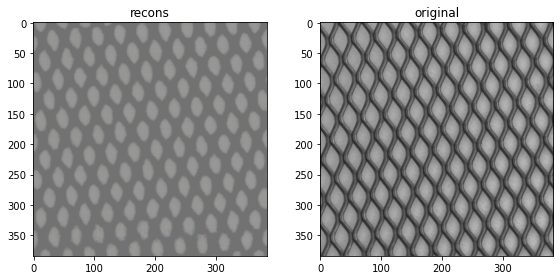

In [8]:
save_name = os.path.join(args.save_dir, 'model/{}_{}_best_model.pt'.format(args.obj, args.model))
early_stop = EarlyStop(patience=12, save_name=save_name)
start_time = time.time()
epoch_time = AverageMeter()
for epoch in range(1, args.epochs + 1):
    need_hour, need_mins, need_secs = convert_secs2time(epoch_time.avg * (args.epochs - epoch))
    need_time = '[Need: {:02d}:{:02d}:{:02d}]'.format(need_hour, need_mins, need_secs)
    print_log(' {:3d}/{:3d} ----- [{:s}] {:s}'.format(epoch, args.epochs, time_string(), need_time), log)
    
    
    train(args, scaler, decmodel, epoch, train_loader, optimizer, log)
    val_loss = val(args, decmodel, epoch, val_loader, log)

    if (early_stop(val_loss, decmodel, optimizer, log)):
        break

    epoch_time.update(time.time() - start_time)
    start_time = time.time()
log.close()

### STEP 5. test 시 이상 이미지에 대한 score map 시각화

In [9]:
def save_test_image(test_loader, test_imgs, recon_imgs, mean, std, seg_scores, gt_mask_list):
    for num in range(len(test_loader)):
        # visualize the score map
        if num in [13, 62, 67, 71, 72, 73, 74, 75, 76, 77]:
            if test_imgs[num].dtype != "uint8":
                test_imgs[num] = denormalization(test_imgs[num], mean, std)

            if recon_imgs[num].dtype != "uint8":
                recon_imgs[num] = denormalization(recon_imgs[num], mean, std)

            scores_img = seg_scores[num]

            fig, plots = plt.subplots(1, 4)

            fig.set_figwidth(9)
            fig.set_tight_layout(True)
            plots = plots.reshape(-1)
            plots[0].imshow(test_imgs[num])
            plots[1].imshow(recon_imgs[num])
            plots[2].imshow(scores_img, cmap='jet', alpha=0.35)
            plots[3].imshow(gt_mask_list[num], cmap=plt.cm.gray)

            plots[0].set_title("real")
            plots[1].set_title("reconst")
            plots[2].set_title("anomaly score")
            plots[3].set_title("gt mask")

            plt.savefig('result/test_image/{}_{}_{}.png'.format(args.model, args.obj, num))


In [10]:
decmodel = nn.Sequential(model, Decoder_r(args))
decmodel.load_state_dict(torch.load(f'result/model/{args.obj}_{args.model}_best_model.pt'), strict=False)
decmodel.to(device)
train_loader, valid_loader, test_loader = get_dataloader(args)

### STEP 6. Pixel AUROC에 대한 평가 진행

In [11]:
def test(model, test_loader, device=torch.device('cuda:0')):
    model.eval()
    MSE = nn.MSELoss(reduction='none')
    det_scores, seg_scores = [],[]
    test_imgs = []
    gt_list = []
    gt_mask_list = []
    recon_imgs = []

    det_sig, seg_sig = 15,6
    for (x, label, mask) in tqdm(test_loader):
        mask = mask.squeeze(0)
        test_imgs.extend(x.cpu().numpy())
        gt_list.extend(label.cpu().numpy())
        gt_mask_list.extend(mask.cpu().numpy())
        score = 0
        with torch.no_grad():
            x = x.to(device)
            x_hat = model(x)

            mse = MSE(x,x_hat)
            score = mse

        score = score.cpu().numpy()
        score = score.mean(1) #  channel간 평균

        det_score, seg_score = copy.deepcopy(score), copy.deepcopy(score)

        for i in range(det_score.shape[0]):
            det_score[i] = gaussian_filter(det_score[i], sigma=det_sig)
        det_scores.extend(det_score)

        for i in range(seg_score.shape[0]):
            seg_score[i] = gaussian_filter(seg_score[i], sigma=seg_sig)
        seg_scores.extend(seg_score)

        recon_imgs.extend(x_hat.cpu().numpy())
    return det_scores, seg_scores, test_imgs, recon_imgs, gt_list, gt_mask_list

100%|██████████| 78/78 [00:05<00:00, 13.62it/s]


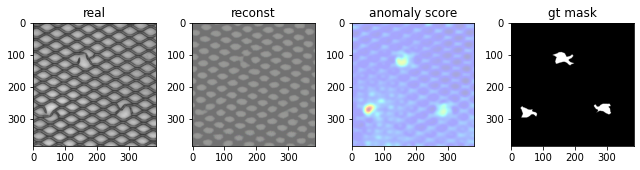

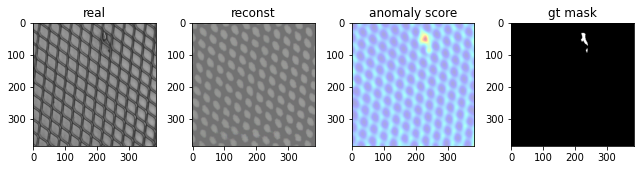

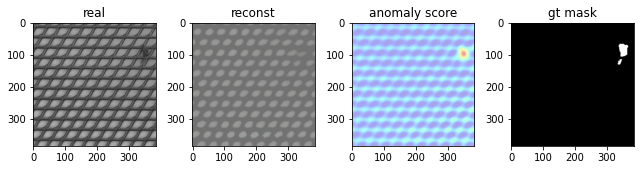

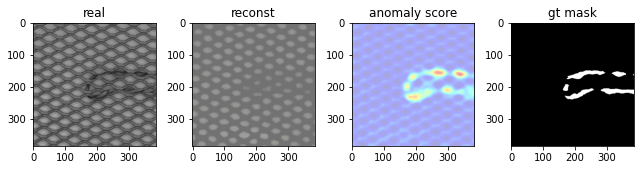

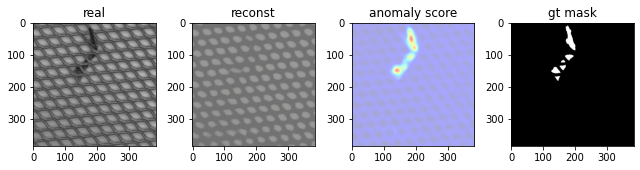

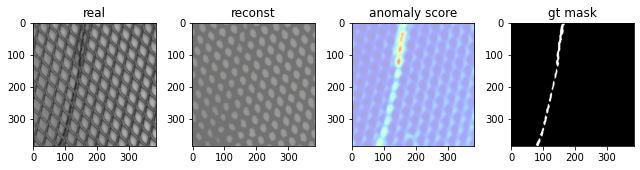

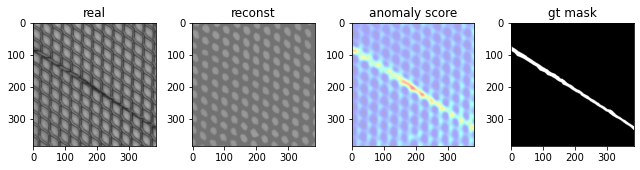

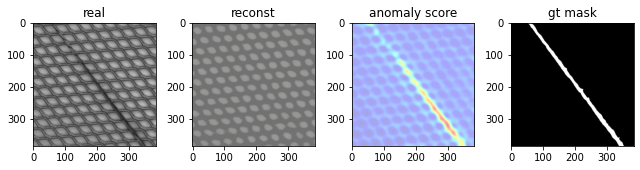

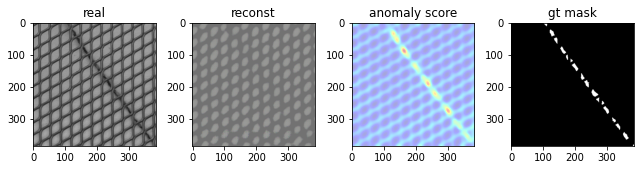

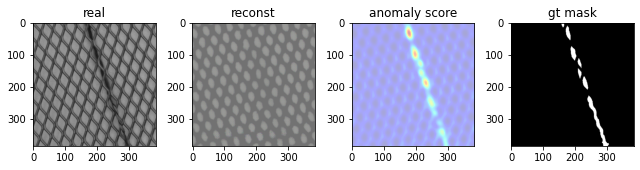

In [12]:
det_scores, seg_scores, test_imgs, recon_imgs, gt_list, gt_mask_list = test(decmodel, test_loader, device)

# det_scores = np.asarray(det_scores)
# max_anomaly_score = det_scores.max()
# min_anomaly_score = det_scores.min()
# det_scores = (det_scores - min_anomaly_score) / (max_anomaly_score - min_anomaly_score)

seg_scores = np.asarray(seg_scores)
max_anomaly_score = seg_scores.max()
min_anomaly_score = seg_scores.min()
seg_scores = (seg_scores - min_anomaly_score) / (max_anomaly_score - min_anomaly_score)

mean, std = obj_stats_384(args.obj)
save_test_image(test_loader, test_imgs, recon_imgs, mean, std, seg_scores, gt_mask_list)

### STEP 7. pixel AUROC 성능 도출

In [13]:
gt_mask = np.asarray(gt_mask_list)
gt_mask = gt_mask.astype('int')
per_pixel_rocauc = roc_auc_score(gt_mask.flatten(), seg_scores.flatten())
print('pixel ROCAUC: %.2f' % (per_pixel_rocauc))

pixel ROCAUC: 0.84
